# Image Manipulation and Point Operations in Python
In this lab, we will explore fundamental techniques for image manipulation and point operations using Python.
The objectives of this lab include:

- Creating and visualizing image matrices.
- Reading, displaying, and processing images using libraries such as OpenCV and Matplotlib.
- Performing histogram-based operations, such as equalization and quantization, to enhance image contrast.
- Analyzing the effects of these operations on image quality and entropy.

---

### Understanding the Libraries Used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**:

- **NumPy**:

- **Matplotlib**:

If not installed, you can install them using `pip install opencv-python numpy matplotlib`.

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Manipulation 1: Matrix Creation and Visualization
In this section, we will:
1. Create specific matrices using vectors A, B, and C.
2. Convert the matrices to `uint8` format.
3. Visualize the matrices using OpenCV and Matplotlib.

### Task 1: Matrix Creation
- **Matrix I1**: 64 rows identical to vector A.  
- **Matrix I2**: A 4x4 block of '1' surrounded by rows of 0 (based on vectors B and C).  
- **Matrix I3**: A 2x2 tiling of matrix I2.  



In [2]:
# Write the code to create vectors and matrices as described above
# Create vectors A, B, and C
A = np.arange(0, 256, 4)
B = np.zeros((8, 8), dtype=np.uint8)
C = np.ones((4, 4), dtype=np.uint8)

# Create Matrix I1: 64 rows identical to vector A
I1 = np.tile(A, (64, 1))

# Create Matrix I2: A 4x4 block of '1' surrounded by rows of 0
I2 = np.zeros((8, 8), dtype=np.uint8)
I2[2:6, 2:6] = C

# Create Matrix I3: A 2x2 tiling of matrix I2
I3 = np.tile(I2, (2, 2))

# Display the matrices
print("Matrix I1:\n", I1)
print("Matrix I2:\n", I2)
print("Matrix I3:\n", I3)

Matrix I1:
 [[  0   4   8 ... 244 248 252]
 [  0   4   8 ... 244 248 252]
 [  0   4   8 ... 244 248 252]
 ...
 [  0   4   8 ... 244 248 252]
 [  0   4   8 ... 244 248 252]
 [  0   4   8 ... 244 248 252]]
Matrix I2:
 [[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]
Matrix I3:
 [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


### Task 2: Convert Matrices to uint8 and Visualize
- Convert matrices to `uint8` format using `np.uint8()`.  
- Visualize the matrices using both OpenCV and Matplotlib.  
- OpenCV displays images in a new window, while Matplotlib embeds them in the notebook.  

---

### Notes:
- `cv.imshow` opens images in a new window, which might not work in Google Colab.  
- Use Matplotlib (`plt.imshow`) in Colab to visualize images directly in the notebook.  
- `uint8` conversion ensures values stay within the valid image range (0-255).  


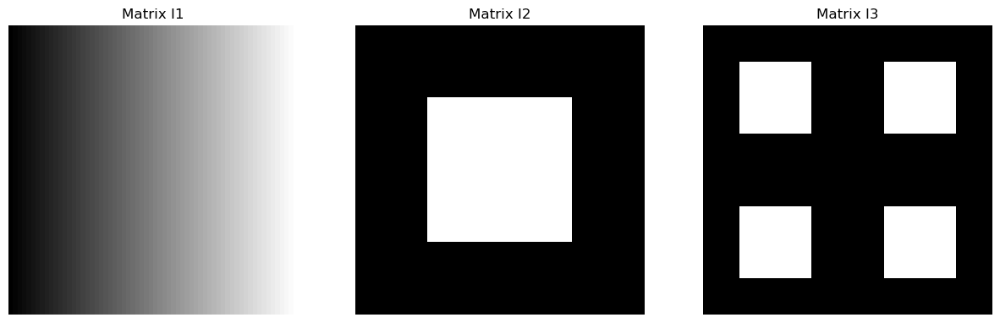

In [3]:
# Write the code to convert matrices to uint8 and visualize them using OpenCV or Matplotlib
# Convert matrices to uint8 format (already in uint8 format)
I1_uint8 = np.uint8(I1)
I2_uint8 = np.uint8(I2)
I3_uint8 = np.uint8(I3)

# Visualize the matrices using Matplotlib
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title('Matrix I1')
plt.imshow(I1_uint8, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Matrix I2')
plt.imshow(I2_uint8, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Matrix I3')
plt.imshow(I3_uint8, cmap='gray')
plt.axis('off')

plt.show()

## Manipulation 2: Image Reading and RGB Channel Operations
In this section, we will:
1. Read and visualize the image `mandrill.png`.
2. Display image properties (size, depth).
3. Separate RGB channels and visualize them independently.
4. Perform RGB channel swapping and save channels in different formats.
5. Convert the image to grayscale using two methods and compare the results.


### Task 1: Read and Display Image
- Use `cv.imread` to load the image.
- Note: OpenCV loads images in BGR format, so convert to RGB using `cv.cvtColor`.
- Visualize the image using Matplotlib.


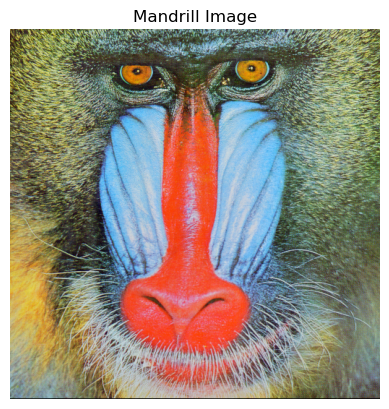

In [4]:
# Write the code to read, convert, and display the image as described above
# Read the image
image = cv.imread('images/mandrill.png')

# Check if the image was successfully read
if image is None:
	print("Error: Image not found or unable to read.")
else:
	# Convert the image from BGR to RGB
	image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)

	# Display the image using Matplotlib
	plt.imshow(image_rgb)
	plt.title('Mandrill Image')
	plt.axis('off')
	plt.show()

### Task 2: Display Image Properties
- Display the image dimensions and data type.
- This provides insight into the image size, channels, and pixel depth.


In [5]:
# Write the code to display the image properties such as shape and data type
print(f"Image shape: {image.shape}")
print(f"Image data type: {image.dtype}")

Image shape: (512, 512, 3)
Image data type: uint8


### Task 3: Separate and Visualize RGB Channels
- Split the image into R, G, and B channels using `cv.split()`.
- Visualize each channel separately.

`B, G, R = cv.split(your_BGR_image)`

or 

`R, G, B = cv.split(your_RGB_image)`

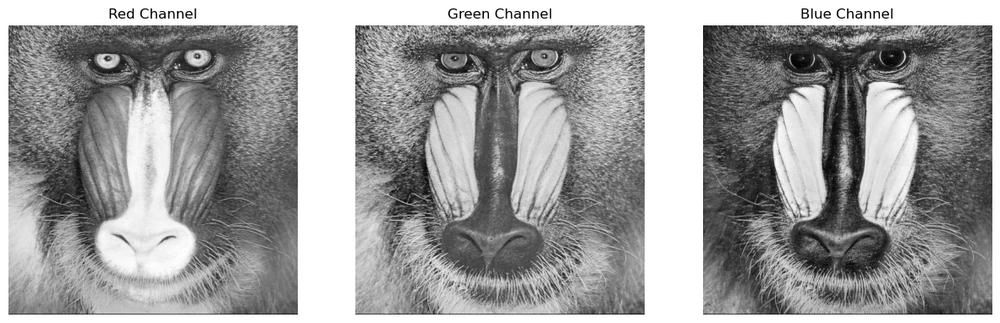

In [6]:
# Put your code here
# Split the image into R, G, and B channels
R, G, B = cv.split(image_rgb)

# Visualize each channel separately
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title('Red Channel')
plt.imshow(R, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Green Channel')
plt.imshow(G, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Blue Channel')
plt.imshow(B, cmap='gray')
plt.axis('off')

plt.show()

### Task 4: RGB Channel Swapping
- Swap the RGB channels to visualize different combinations.
- Perform all combinations (RGB, RBG, GRB, GBR, BRG, BGR).

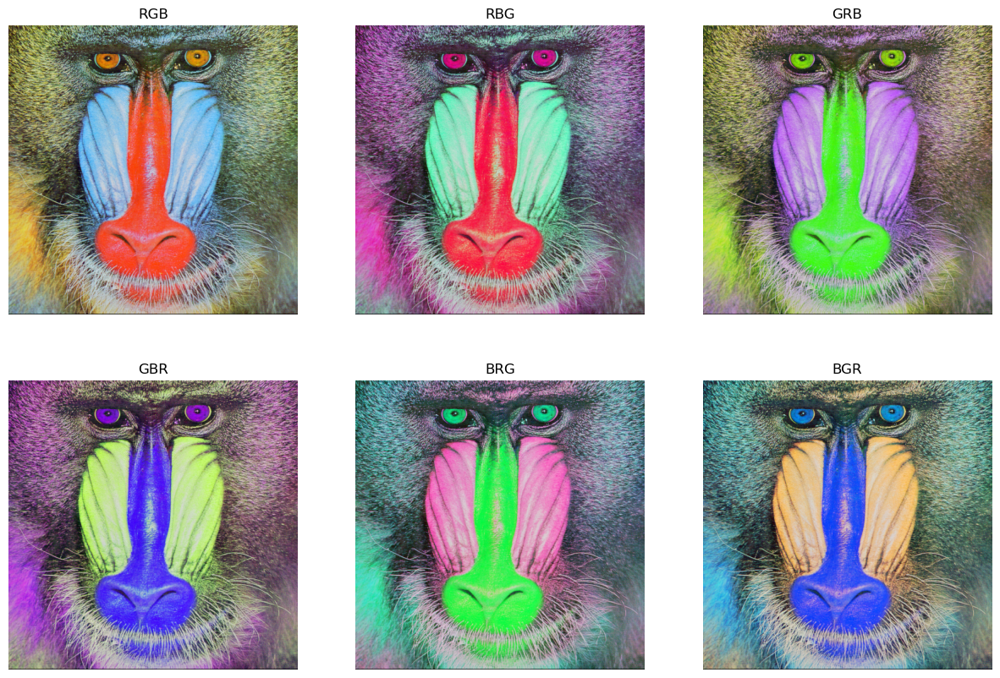

In [7]:
# Write the code to swap RGB channels and visualize different combinations
combinations = [
    ('RGB', image_rgb),
    ('RBG', cv.merge([R, B, G])),
    ('GRB', cv.merge([G, R, B])),
    ('GBR', cv.merge([G, B, R])),
    ('BRG', cv.merge([B, R, G])),
    ('BGR', image)
]

plt.figure(figsize=(15, 10))

for i, (title, img) in enumerate(combinations):
    plt.subplot(2, 3, i + 1)
    plt.title(title)
    plt.imshow(img)
    plt.axis('off')

plt.show()

### Task 5: Save RGB Channels in Different Formats
- Save the Red channel as `.png`, Green as `.bmp`, and Blue as `.jpeg`.
- Use `cv.imwrite` to save images.


In [8]:
# Save channels in different formats
cv.imwrite('red_channel.png', R)
cv.imwrite('green_channel.bmp', G)
cv.imwrite('blue_channel.jpeg', B)

True

### Task 6: Convert an image to grayscale.

- Use `cv.cvtColor` to convert the image to grayscale.
- Make sure your are using the right transformation (BGR2GRAY or RGB2GRAY) according to your image format.
- Visualize the grayscale image.



Alternatively, use the previously extracted R, G, and B channels to manually compute the grayscale image using the following formula:

1. Weighted Grayscale Conversion:

`Igray = 0.2989 * R + 0.5870 * G + 0.1140 * B`

2. Simple Average Method:

`Igray = Mean(R, G, B)`

After applying this transformation, ensure that you properly visualize and compare the grayscale output from both methods to confirm consistency.

### Question:

- These coefficients `(0.2989, 0.5870, 0.1140)` are not arbitrary—they come from a standard model used in image processing.

- How are these coefficients determined? What do they represent, and why are they used instead of a simple average?

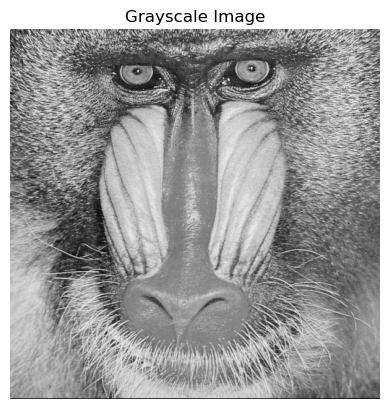

In [9]:
# Convert your color image to grayscale
image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

plt.imshow(image_gray, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

***Add your analysis and comments here***

The coefficients (0.2989, 0.5870, 0.1140) are based on human visual perception, where the eye is most sensitive to green, moderately sensitive to red, and least sensitive to blue. These weights originate from the luminance perception model used in NTSC and sRGB color spaces, ensuring grayscale images accurately represent perceived brightness. A simple average of RGB values (Mean(R, G, B)) would distribute equal weight across all channels, leading to an unnatural brightness representation. Using cv.cvtColor with BGR2GRAY or RGB2GRAY applies this weighted transformation automatically. Comparing grayscale images produced by OpenCV and manual calculations helps confirm consistency.

---

### Task 7: Negative Transformation
The negative transformation is a simple yet powerful operation applied to images. It inverts the pixel intensities of the image, enhancing white or gray details embedded in darker regions.

The formula for the negative transformation is:

    I_negative = 255 - I

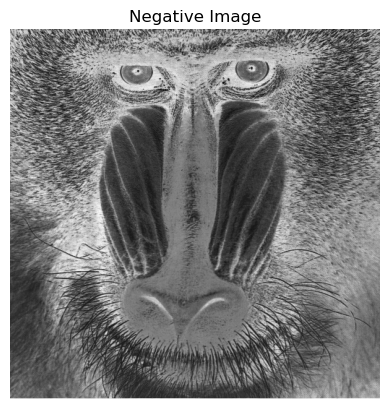

In [10]:
# Write the code to compute the negative transformation
# Compute the negative transformation
I_negative = 255 - image_gray

# Display the negative image using Matplotlib
plt.imshow(I_negative, cmap='gray')
plt.title('Negative Image')
plt.axis('off')
plt.show()

### Task 8: Contrast and Brightness Adjustment
1. **Define what contrast and brightness adjustment is.**
   - Provide a brief explanation of how contrast and brightness adjustment works.
   - Include its formula:
      
     

   I_new = alpha x I + beta


Where:
   - I_new: Adjusted pixel intensity
   - I: Original pixel intensity
   - alpha: Gain
   - beta: Bias


2. **Explain the roles of alpha and beta:**
   - What does alpha (gain) control?
   - What does beta (bias) control?
   - How do changes to these parameters affect the appearance of an image?

*Write your answers below:*

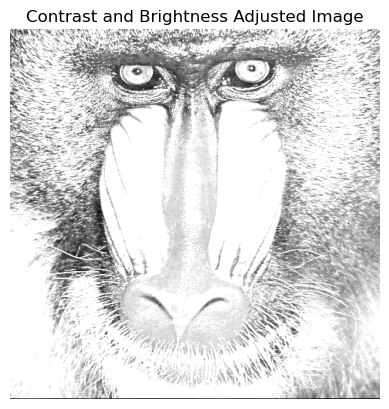

In [11]:
# Write the code here
# Define the alpha (gain) and beta (bias) values
alpha = 1.5  # Contrast control (1.0-3.0)
beta = 50    # Brightness control (0-100)

# Apply the contrast and brightness adjustment
I_new = cv.convertScaleAbs(image_gray, alpha=alpha, beta=beta)

# Display the adjusted image using Matplotlib
plt.imshow(I_new, cmap='gray')
plt.title('Contrast and Brightness Adjusted Image')
plt.axis('off')
plt.show()

***Add your analysis and comments here***

Contrast and brightness adjustments alter pixel intensity to improve visual clarity. The formula I_new = alpha × I + beta modifies each pixel, where alpha (gain) controls contrast by scaling intensity differences, enhancing or reducing detail visibility, and beta (bias) adjusts brightness by uniformly increasing or decreasing intensity. A higher alpha amplifies contrast, making dark areas darker and bright areas brighter, while a lower alpha reduces contrast, creating a more uniform appearance. Adjusting beta shifts brightness—positive values brighten the image, while negative values darken it. The provided code applies this transformation to a grayscale image and visualizes its impact.

---

### Task 9: Gamma Transformation

Gamma correction applies a non-linear adjustment to pixel intensities.

#### Formula:
I_gamma = 255 * (I / 255) ^ gamma

#### Where:
- I_gamma: Gamma-corrected pixel intensity
- I: Original pixel intensity
- gamma: Gamma value
  - gamma > 1: Darkens the image and enhances darker regions.
  - gamma < 1: Brightens the image and enhances brighter regions.

---

Explain the Utility of Gamma Transformation
1. Why is gamma correction important in image processing?
2. In what situations is gamma correction useful?
3. How does gamma correction help in adjusting images for different display devices?
4. What happens to the histogram of an image when applying gamma correction with gamma > 1 vs. gamma < 1?

*Write your answers below:*

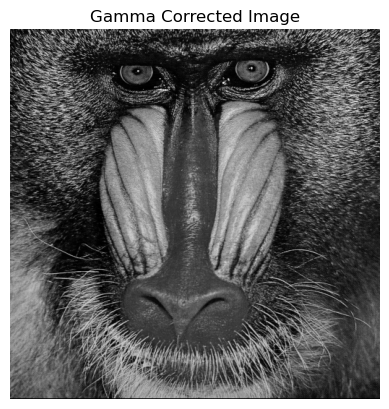

In [12]:
# Write the code here
# Define the gamma value
gamma = 2.2

# Apply gamma correction
I_gamma = np.array(255 * (image_gray / 255) ** gamma, dtype='uint8')

# Display the gamma-corrected image using Matplotlib
plt.imshow(I_gamma, cmap='gray')
plt.title('Gamma Corrected Image')
plt.axis('off')
plt.show()

***Add your analysis and comments here***

1. Importance of Gamma Correction in Image Processing
Gamma correction aligns brightness perception with human vision, which is more sensitive to darker tones. It compensates for the non-linear intensity response of cameras and displays, preventing detail loss in bright and dark areas.

2. When is Gamma Correction Useful?
Enhancing images taken in poor lighting conditions.
Correcting overexposed or underexposed images.
Ensuring consistent appearance across different display devices.
3. Role of Gamma Correction in Display Adjustment
Since different screens apply gamma differently, correction ensures uniform brightness. It counteracts gamma encoding in cameras and monitors, preventing unwanted distortions while optimizing contrast for TVs, projectors, and mobile screens.

4. Histogram Effects of Gamma Correction
Gamma > 1: Darkens the image, shifting the histogram toward lower intensities (left-skewed).
Gamma < 1: Brightens the image, shifting the histogram toward higher intensities (right-skewed).

---

### Task 10: Thresholding (Binarization)

Thresholding is a technique used to convert a grayscale image into a binary image.  
The process involves setting a threshold value \( T \), and each pixel is assigned either **0 (black)** or **255 (white)** based on the condition:

- If pixel intensity \( I(x, y) \) is greater than \( T \), set it to 255 (white).
- Otherwise, set it to 0 (black).

#### Formula:
I_bin(x, y) =
- 255, if I(x, y) > T
- 0, otherwise

This process simplifies the image and is useful in object detection and segmentation.


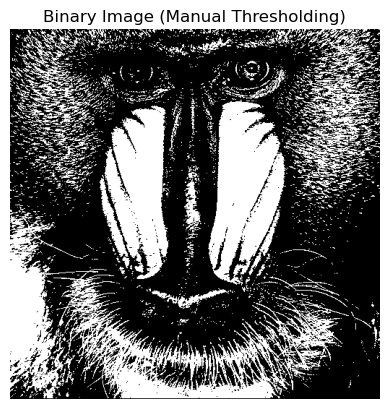

In [13]:
# Apply Manual Thresholding: (can be changed for experimentation)
threshold_value = 150  # You can change this value for experimentation
_, I_bin = cv.threshold(image_gray, threshold_value, 255, cv.THRESH_BINARY)

plt.imshow(I_bin, cmap='gray')
plt.title('Binary Image (Manual Thresholding)')
plt.axis('off')
plt.show()

***Add your analysis and comments here***

Thresholding converts a grayscale image into a binary one, aiding segmentation, edge detection, and object recognition. The threshold value 
T dictates which pixels become white (255) or black (0), impacting image clarity and feature extraction. A higher 
T retains only the brightest details, making most pixels black, while a lower 
T results in a predominantly white image. Manual selection of 
T requires tuning, especially in varying lighting conditions. For better adaptability, adaptive thresholding or Otsu’s method can dynamically determine 
T, ensuring more effective segmentation in uneven lighting.


---

### Task 11: Otsu's Thresholding

Otsu’s method is an advanced form of thresholding that automatically determines the **optimal threshold value \( T \)**.  
Instead of manually setting \( T \), Otsu’s algorithm finds a value that minimizes the variance between foreground and background pixel intensities.

#### Key Advantages:
- **Automatic threshold selection** (no need to choose \( T \) manually).
- **Works well on images with a bimodal histogram** (two distinct peaks in intensity distribution).
- **Reduces sensitivity to lighting variations.**


Compare the results of both methods **manual thresholding** and **Otsu's Thresholding**

otsu_thresh: 128.0


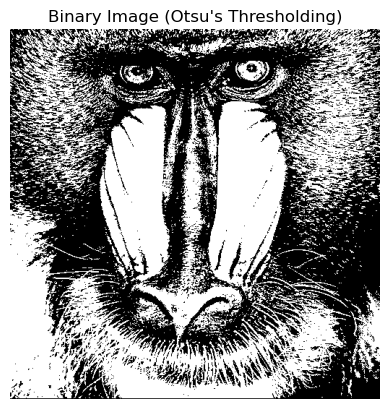

In [14]:
# Apply Otsu's Thresholding (automatically selects the optimal threshold)
otsu_thresh, I_otsu = cv.threshold(image_gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
print(f"otsu_thresh: {otsu_thresh}")
# Display the binary image using Otsu's method
plt.imshow(I_otsu, cmap='gray')
plt.title("Binary Image (Otsu's Thresholding)")
plt.axis('off')
plt.show()


***Add your analysis and comments here***

Otsu’s thresholding, which determined an optimal threshold of 128.0, is a robust alternative to manual thresholding. It automatically selects the threshold by analyzing the histogram, making it effective for bimodal images where foreground and background intensities form two peaks. Unlike manual thresholding, which relies on trial and error, Otsu’s method minimizes within-class variance, enhancing segmentation accuracy. However, it may struggle with uniform intensity distributions or noisy backgrounds. Comparing both methods highlights that Otsu’s thresholding often provides better object separation, particularly when lighting conditions vary.

---


### Now, repeat Tasks 8 to 11 using different images of your choice and analyze the results.

---

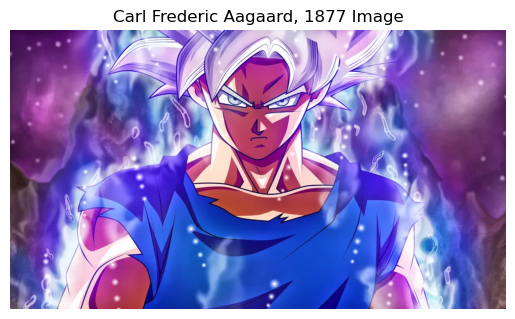

In [16]:
image = cv.imread('images/goku.jpg')

if image is None:
	print("Error: Image not found or unable to read.")
else:
	image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)

	plt.imshow(image_rgb)
	plt.title('Carl Frederic Aagaard, 1877 Image')
	plt.axis('off')
	plt.show()

### Task 8: Contrast and Brightness Adjustment

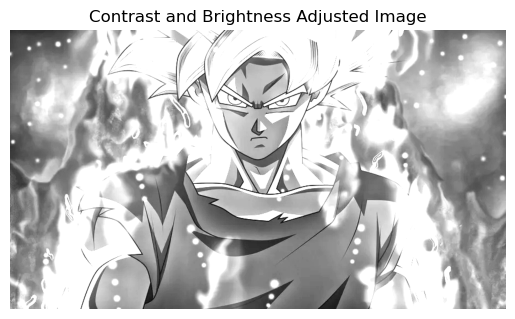

In [17]:
image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Write the code here
alpha = 1.5  # Contrast control (1.0-3.0)
beta = 50    # Brightness control (0-100)

# Apply the contrast and brightness adjustment
I_new = cv.convertScaleAbs(image_gray, alpha=alpha, beta=beta)

# Display the adjusted image using Matplotlib
plt.imshow(I_new, cmap='gray')
plt.title('Contrast and Brightness Adjusted Image')
plt.axis('off')
plt.show()

### Task 9: Gamma Transformation

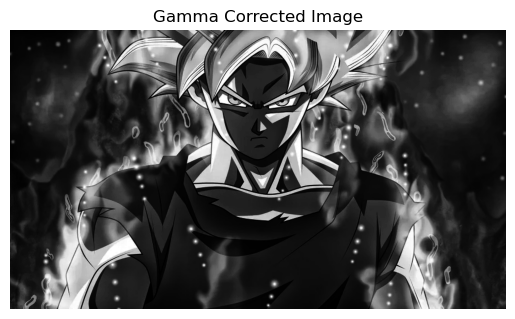

In [18]:
# Write the code here
gamma = 2.2

I_gamma = np.array(255 * (image_gray / 255) ** gamma, dtype='uint8')

plt.imshow(I_gamma, cmap='gray')
plt.title('Gamma Corrected Image')
plt.axis('off')
plt.show()

### Task 10: Thresholding (Binarization)

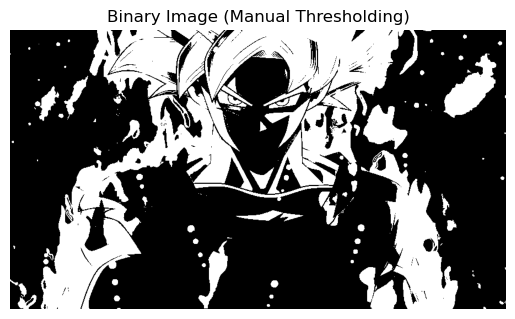

In [19]:
# Apply Manual Thresholding: (can be changed for experimentation)
threshold_value = 127  # You can change this value for experimentation
_, I_bin = cv.threshold(image_gray, threshold_value, 255, cv.THRESH_BINARY)

plt.imshow(I_bin, cmap='gray')
plt.title('Binary Image (Manual Thresholding)')
plt.axis('off')
plt.show()

### Task 11: Otsu's Thresholding

otsu_thresh: 143.0


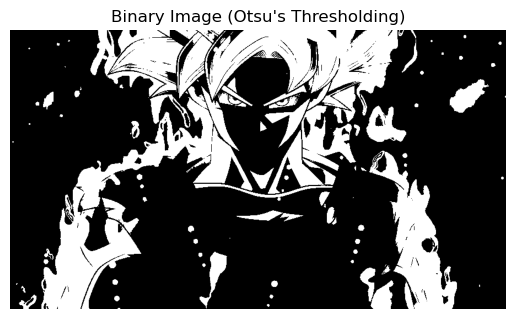

In [20]:
# Apply Otsu's Thresholding (automatically selects the optimal threshold)
otsu_thresh, I_otsu = cv.threshold(image_gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
print(f"otsu_thresh: {otsu_thresh}")

# Display the binary image using Otsu's method
plt.imshow(I_otsu, cmap='gray')
plt.title("Binary Image (Otsu's Thresholding)")
plt.axis('off')
plt.show()


> We can notice that the Otsu threshold `otsu_thresh` changed from `128.0` in the original monkey image to `130.0` in the new image.

# Manipulation 3: Quantize a Grayscale Image
### Understanding Quantization and Histograms
1- Quantization is the process of reducing the number of intensity levels in an image. In grayscale images, pixel values range from 0 to 255, representing 256 possible shades. By reducing these levels (e.g., to 128, 64, 32, etc.), we limit the number of shades, simplifying the image but potentially reducing its quality.

2- A histogram represents the distribution of pixel intensities in an image. It shows how frequently each intensity value appears. When we quantize an image, we effectively "group" similar intensity values, leading to a histogram with fewer distinct peaks. Observing these histograms helps us understand how information is lost and how the image’s appearance is affected.

---

Instructions
In this section, you will:

1- Quantize the grayscale image into different levels (128, 64, 32, 16, 8, 4, 2).
2- Visualize the quantized images and their histograms.
3- Observe the effects of reduced levels on image quality.

To quantize the grayscale image, apply the following formula:

`quantized_image = (Img_gray // (256 / levels)) * (256 / levels)`


### Task 1: Image Quantization
The goal is to observe how reducing the number of intensity levels affects image quality.

Steps:
Convert the image to grayscale using cv.cvtColor.

Define different quantization levels to reduce the number of shades in the image (e.g., quant_levels = {128, 64, 32, 16, 8, 4, 2}).

Apply quantization using the formula above.

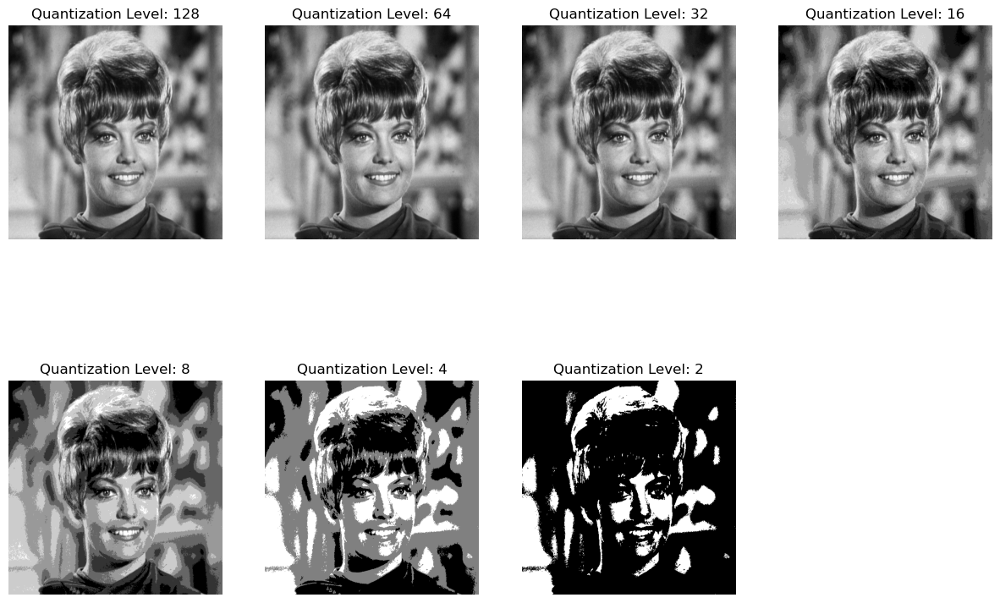

In [21]:
# Use the following image for this section
img = cv.imread('./images/zelda.png')

#comvert to B&W
image_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

quant_levels = [128, 64, 32, 16, 8, 4, 2]

# Apply quantization and visualize the results
plt.figure(figsize=(15, 10))

for i, levels in enumerate(quant_levels):
    quantized_image = (image_gray // (256 // levels)) * (256 // levels)
    
    plt.subplot(2, 4, i + 1)
    plt.title(f'Quantization Level: {levels}')
    plt.imshow(quantized_image, cmap='gray')
    plt.axis('off')

plt.show()

***Add your analysis and comments here***

- High Quantization (128 levels): The image remains visually close to the original, with minimal loss of detail.
- Medium Quantization (64, 32 levels): Some smooth intensity transitions are lost, resulting in a slightly blocky appearance.
- Low Quantization (8, 4, 2 levels): Significant detail loss occurs, with visible banding and a posterized effect.

---

### Task 2: Histogram Analysis
- Compute and display histograms for each quantized image.
- Use `cv.calcHist` to compute the histogram.

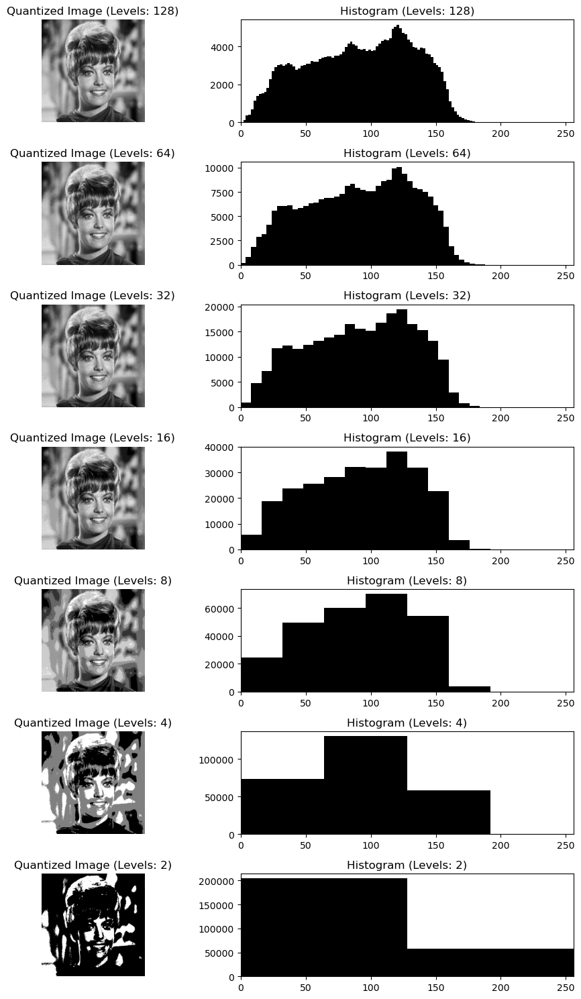

In [22]:
# Put your code here
# Define different quantization levels

fig, axes = plt.subplots(len(quant_levels), 2, figsize=(10, 15))

for i, levels in enumerate(quant_levels):
    quantized_image = (image_gray // (256 // levels)) * (256 // levels)
    
    axes[i, 0].imshow(quantized_image, cmap='gray')
    axes[i, 0].set_title(f'Quantized Image (Levels: {levels})')
    axes[i, 0].axis('off')
    
    axes[i, 1].hist(quantized_image.ravel(), bins=levels, range=[0, 256], color='black')
    axes[i, 1].set_title(f'Histogram (Levels: {levels})')
    axes[i, 1].set_xlim([0, 256])

plt.tight_layout()
plt.show()

***Add your analysis and comments here***

The histograms show how grayscale quantization affects image quality:

Original Image: Smooth histogram with full intensity range.
128 & 64 Levels: Minimal loss, closely resembles original.
32 & 16 Levels: Some posterization, visible intensity grouping.
8 & 4 Levels: Strong quantization effects, distinct spikes.
2 Levels: Binary image, extreme detail loss.
Higher levels preserve details; lower levels cause severe loss and posterization.


---
# Manipulation 4: Histogram Equalization
- Histogram equalization is a technique used to enhance the contrast of an image by redistributing pixel intensity values more evenly. It works by spreading out the most frequent intensity values, making details in darker and lighter regions more distinguishable.

- This method is particularly useful in images with low contrast, where pixel intensities are clustered within a narrow range. By equalizing the histogram, we aim to improve visibility and highlight important details.


### Task 1: Load and Analyze the Image

1. Load the image: Read the `flower.bmp` image using OpenCV.
2. Display the original color image.
4. Convert the image to grayscale.


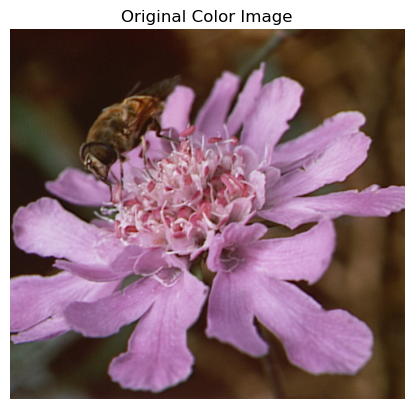

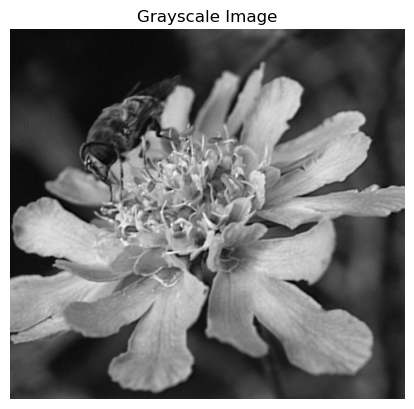

In [58]:
# Put your code here
img_color = cv.imread('./images/flower.bmp')

if img_color is None:
    print("Error: Image not found or unable to read.")
else:
    # Display the original color image using Matplotlib
    img_color_rgb = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)
    plt.imshow(img_color_rgb)
    plt.title('Original Color Image')
    plt.axis('off')
    plt.show()

    # Convert the image to grayscale
    image_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)
    plt.imshow(image_gray, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')
    plt.show()

### Task 2: Compute and Display Histogram and Normalized Histogram

1. Calculate the histogram of the grayscale image using cv.calcHist(). This function provides the frequency of each intensity value (0–255).
2. Normalize the histogram by dividing each bin count by the total number of pixels in the image. This normalization converts the histogram into a probability distribution, which is useful for understanding the relative frequency of intensity values.
3. Visualize the original histogram and the normalized histogram side by side using Matplotlib. This will help in understanding how the intensity values are distributed and whether contrast enhancement is needed.

After visualizing the histograms, analyze:

1. Is the histogram spread across the full intensity range (0–255), or is it concentrated in a narrow range?
2. Does the image seem to have high or low contrast?

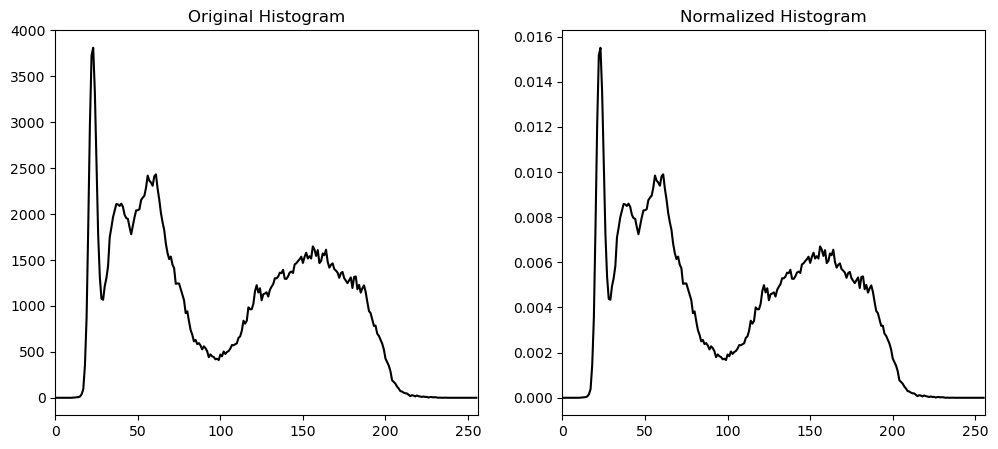

In [51]:
# Compute the histogram
hist = cv.calcHist([image_gray], [0], None, [256], [0, 256])

# Normalize the histogram
hist_norm = hist / hist.sum()

# Plot the original and normalized histograms
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(hist, color='black')
axes[0].set_title('Original Histogram')
axes[0].set_xlim([0, 256])

axes[1].plot(hist_norm, color='black')
axes[1].set_title('Normalized Histogram')
axes[1].set_xlim([0, 256])

plt.show()


***Add your analysis and comments here***

Original Histogram (Left Plot)
Uneven intensity distribution with distinct peaks.
Indicates dominance of certain brightness levels.
Possible low contrast due to intensity clustering.
Normalized Histogram (Right Plot)
Maintains the original shape but scaled to a normalized frequency range.
Highlights the imbalance in intensity distribution.
Impact of Histogram Equalization
Before Equalization: Pixel intensities are concentrated in specific ranges, reducing contrast.
After Equalization: Intensities are more evenly spread, enhancing visibility in both dark and bright areas.
Expected Outcome: Improved contrast, revealing finer image details that were previously less noticeable.


### Task 3: Compute and Display Cumulative Histogram

- Calculate the cumulative histogram of the grayscale image using `cumsum()` on the computed histogram.
- Plot the cumulative histogram using Matplotlib.


***What is a Cumulative Histogram?***
A cumulative histogram represents the cumulative sum of pixel intensities in an image. Unlike a regular histogram that shows the frequency of each intensity value, a cumulative histogram provides insight into how intensities accumulate across the range.

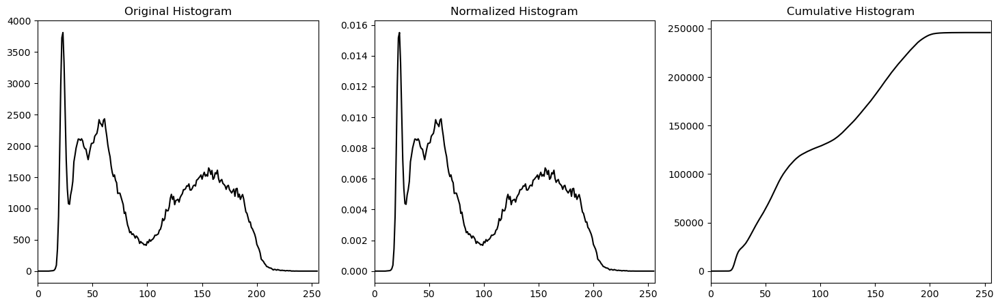

In [52]:
# Compute the histogram
hist = cv.calcHist([image_gray], [0], None, [256], [0, 256])

# Normalize the histogram
hist_norm = hist / hist.sum()

# Compute the cumulative histogram
cumulative_hist = hist.cumsum()

# Plot the original, normalized, and cumulative histograms
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(hist, color='black')
axes[0].set_title('Original Histogram')
axes[0].set_xlim([0, 256])

axes[1].plot(hist_norm, color='black')
axes[1].set_title('Normalized Histogram')
axes[1].set_xlim([0, 256])

axes[2].plot(cumulative_hist, color='black')
axes[2].set_title('Cumulative Histogram')
axes[2].set_xlim([0, 256])

plt.show()

### Task 4: Histogram Equalization Using OpenCV


1. Apply OpenCV’s histogram equalization on the grayscale image using `cv.equalizeHist()`.
2. Compute and visualize the histogram of the equalized image.
3. Compare the histograms of the original grayscale image and the equalized image to observe how pixel intensities are redistributed.
4. Display the original and equalized grayscale images side by side to visually assess the contrast improvement.
5. Comment the results about how weel the image it becomes.

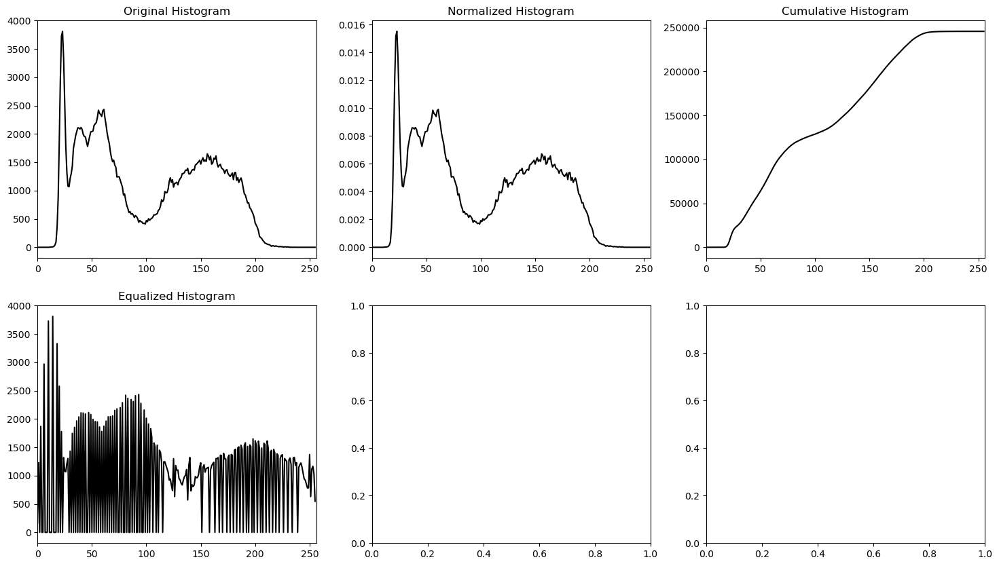

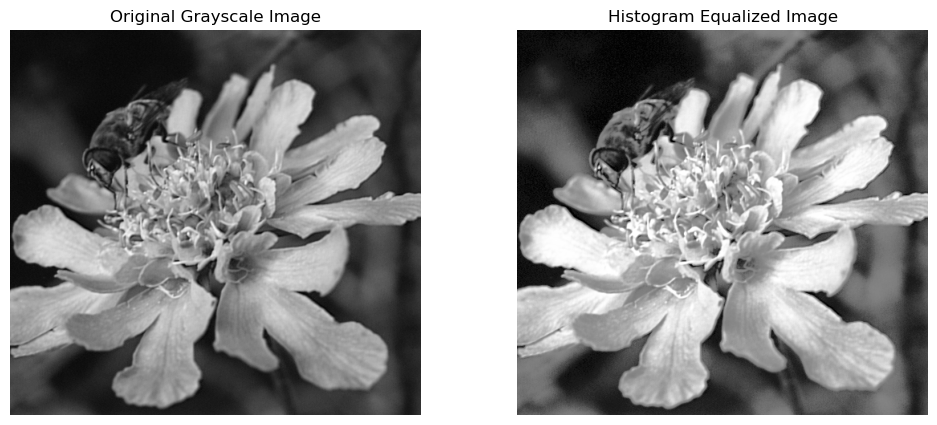

In [53]:
# Apply histogram equalization
equalized_image = cv.equalizeHist(image_gray)

# Compute histogram of the equalized image
equalized_hist = cv.calcHist([equalized_image], [0], None, [256], [0, 256])

# Plot the original, normalized, cumulative, and equalized histograms
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes[0, 0].plot(hist, color='black')
axes[0, 0].set_title('Original Histogram')
axes[0, 0].set_xlim([0, 256])

axes[0, 1].plot(hist_norm, color='black')
axes[0, 1].set_title('Normalized Histogram')
axes[0, 1].set_xlim([0, 256])

axes[0, 2].plot(cumulative_hist, color='black')
axes[0, 2].set_title('Cumulative Histogram')
axes[0, 2].set_xlim([0, 256])

axes[1, 0].plot(equalized_hist, color='black')
axes[1, 0].set_title('Equalized Histogram')
axes[1, 0].set_xlim([0, 256])

# Display original and equalized images side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Grayscale Image')
axes[0].axis('off')

axes[1].imshow(equalized_image, cmap='gray')
axes[1].set_title('Histogram Equalized Image')
axes[1].axis('off')

plt.show()


***Add your analysis and comments here***

- Contrast Enhancement: The equalized image shows improved contrast, making dark and bright regions more distinguishable. Fine details like textures and edges become more prominent.
- Histogram Comparison: The original histogram is clustered in a limited range, indicating low contrast, while the equalized histogram is more evenly spread, utilizing the full intensity spectrum (0–255).
- Effectiveness: Histogram equalization works well for low-contrast images, but may introduce artifacts or excessive brightness variations if the original intensity distribution is not ideal for equalization. 

### Task 5: Manual Histogram Equalization and Comparison with OpenCV

In this task, you will implement histogram equalization manually and compare the results with OpenCV’s cv.equalizeHist() function. This will help in understanding how histogram equalization works at a pixel level.


1. Compute the histogram of the grayscale image.
2. Calculate the cumulative distribution function (CDF) from the histogram.
3. Normalize the CDF to scale pixel values between 0 and 255.
4. Use the CDF as a mapping function to adjust pixel intensities in the grayscale image.
5. Compare the manually equalized image with OpenCV’s equalizeHist() output.
6. Compute and visualize histograms of both equalized images.
7. Analyze the results, noting differences in contrast and intensity distribution.

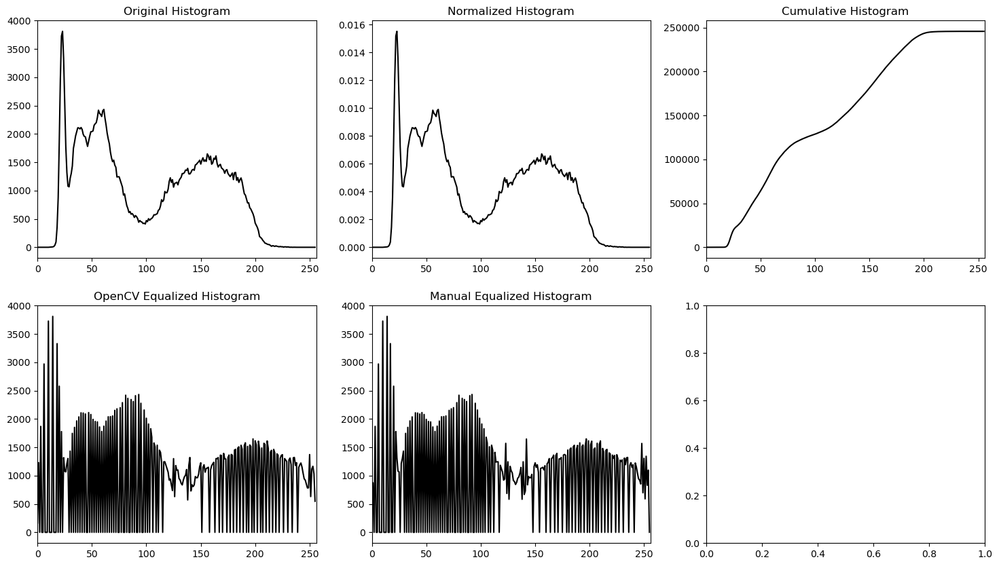

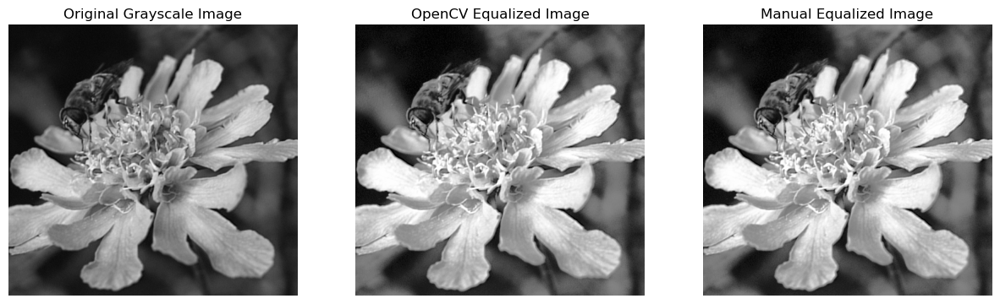

In [54]:
equalized_image_cv = cv.equalizeHist(image_gray)

equalized_hist_cv = cv.calcHist([equalized_image_cv], [0], None, [256], [0, 256])

cdf = cumulative_hist / cumulative_hist.max() * 255
cdf = cdf.astype('uint8')
equalized_image_manual = cdf[image_gray]

equalized_hist_manual = cv.calcHist([equalized_image_manual], [0], None, [256], [0, 256])

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes[0, 0].plot(hist, color='black')
axes[0, 0].set_title('Original Histogram')
axes[0, 0].set_xlim([0, 256])

axes[0, 1].plot(hist_norm, color='black')
axes[0, 1].set_title('Normalized Histogram')
axes[0, 1].set_xlim([0, 256])

axes[0, 2].plot(cumulative_hist, color='black')
axes[0, 2].set_title('Cumulative Histogram')
axes[0, 2].set_xlim([0, 256])

axes[1, 0].plot(equalized_hist_cv, color='black')
axes[1, 0].set_title('OpenCV Equalized Histogram')
axes[1, 0].set_xlim([0, 256])

axes[1, 1].plot(equalized_hist_manual, color='black')
axes[1, 1].set_title('Manual Equalized Histogram')
axes[1, 1].set_xlim([0, 256])

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Grayscale Image')
axes[0].axis('off')

axes[1].imshow(equalized_image_cv, cmap='gray')
axes[1].set_title('OpenCV Equalized Image')
axes[1].axis('off')

axes[2].imshow(equalized_image_manual, cmap='gray')
axes[2].set_title('Manual Equalized Image')
axes[2].axis('off')

plt.show()

***Add your analysis and comments here***

- Contrast Enhancement: Both OpenCV and manual methods effectively improve contrast, enhancing detail visibility.
- Histogram Comparison: The original histogram is concentrated in specific intensity ranges, while both equalized histograms are more evenly distributed across 0-255, achieving better contrast.
- Differences: The manual equalization histogram closely resembles OpenCV’s, though minor differences may occur due to rounding errors or interpolation in OpenCV’s algorithm.
- Effectiveness: Histogram equalization is beneficial for low-contrast images, but may introduce artifacts in already well-balanced images.  


### Task 6: Equalize Color Image Channels Independently

- Objective: Apply histogram equalization independently to each color channel (B, G, R) and calculate the entropy of the equalized channels.
- Steps:
    1. Split the color image into its Blue (B), Green (G), and Red (R) channels.
    2. Equalize each channel independently using cv.equalizeHist.
    3. Merge the equalized channels back into a single color image.
    4. Define a function to calculate entropy for a single channel.
    5. Compute the entropy of each equalized channel to analyze the uniformity of pixel intensities.
    6. Visualize the original color image and the independently equalized color image side by side.
- Comments:
    - Independent equalization of channels can enhance contrast but might cause slight color distortions.
    - Higher entropy values indicate a more uniform intensity distribution.

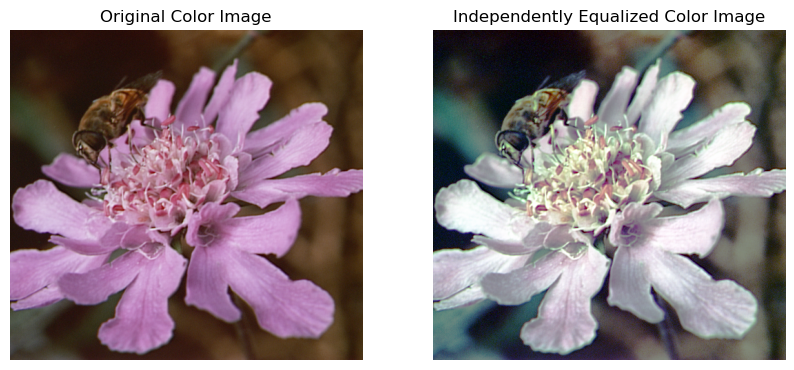

Entropy of Blue channel: 7.110762596130371
Entropy of Green channel: 7.319502830505371
Entropy of Red channel: 7.316510200500488


In [55]:
# Put your code here
B, G, R = cv.split(img_color)

B_eq = cv.equalizeHist(B)
G_eq = cv.equalizeHist(G)
R_eq = cv.equalizeHist(R)

img_equalized = cv.merge([B_eq, G_eq, R_eq])

def calculate_entropy(channel):
    hist = cv.calcHist([channel], [0], None, [256], [0, 256])
    hist_norm = hist / hist.sum()
    entropy = -np.sum(hist_norm * np.log2(hist_norm + 1e-7))
    return entropy

entropy_B = calculate_entropy(B_eq)
entropy_G = calculate_entropy(G_eq)
entropy_R = calculate_entropy(R_eq)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Color Image')
plt.imshow(cv.cvtColor(img_color, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Independently Equalized Color Image')
plt.imshow(cv.cvtColor(img_equalized, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

print(f"Entropy of Blue channel: {entropy_B}")
print(f"Entropy of Green channel: {entropy_G}")
print(f"Entropy of Red channel: {entropy_R}")

***Add your analysis and comments here***

- Contrast Enhancement: The independently equalized image shows improved contrast, making details clearer.
- Color Distortion: Equalizing each channel separately can cause color shifts, as the balance between B, G, and R intensities changes.
- Entropy Analysis: Higher entropy values indicate a more even pixel intensity distribution, reflecting enhanced contrast.
- Practical Applications: Useful for enhancing low-light images, though color correction may be needed to prevent unnatural hues.

### Task 7: Equalize Color Channels Using Cumulative Histogram

- Objective: Perform histogram equalization on each color channel (B, G, R) using the cumulative histogram from the grayscale image and calculate the entropy for the resulting image.
- Steps:
    1. Normalize the cumulative histogram from the grayscale image to scale it to the range [0, 255].
    2. Apply the normalized cumulative histogram to each color channel (B, G, R).
    3. Merge the equalized channels back into a single color image.
    4. Calculate the entropy of the equalized channels to analyze the uniformity of pixel intensities.
    5. Display the original and cumulatively equalized color images for comparison.

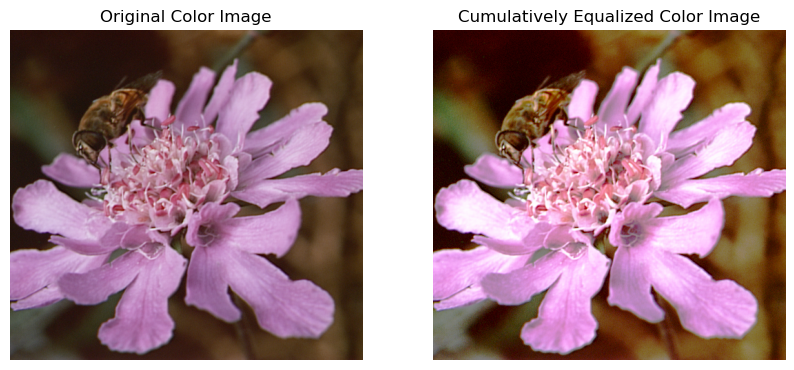

Entropy of Blue channel (cumulative): 6.119925498962402
Entropy of Green channel (cumulative): 7.108396053314209
Entropy of Red channel (cumulative): 6.842179298400879


In [59]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def calculate_entropy(channel):
    hist = cv.calcHist([channel], [0], None, [256], [0, 256])
    hist_norm = hist / hist.sum()
    entropy = -np.sum(hist_norm * np.log2(hist_norm + 1e-7))
    return entropy

# Load color image
img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

# Compute histogram and cumulative distribution function (CDF) for grayscale image
hist_gray = cv.calcHist([img_gray], [0], None, [256], [0, 256])
cdf_gray = hist_gray.cumsum()
cdf_gray_normalized = cdf_gray * 255 / cdf_gray.max()

# Split BGR channels
B, G, R = cv.split(img_color)

# Apply cumulative histogram equalization using grayscale CDF
B_eq_cumulative = np.interp(B.flatten(), np.arange(256), cdf_gray_normalized).reshape(B.shape).astype('uint8')
G_eq_cumulative = np.interp(G.flatten(), np.arange(256), cdf_gray_normalized).reshape(G.shape).astype('uint8')
R_eq_cumulative = np.interp(R.flatten(), np.arange(256), cdf_gray_normalized).reshape(R.shape).astype('uint8')

# Merge equalized channels
img_equalized_cumulative = cv.merge([B_eq_cumulative, G_eq_cumulative, R_eq_cumulative])

# Compute entropy for each channel
entropy_B_cumulative = calculate_entropy(B_eq_cumulative)
entropy_G_cumulative = calculate_entropy(G_eq_cumulative)
entropy_R_cumulative = calculate_entropy(R_eq_cumulative)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Color Image')
plt.imshow(cv.cvtColor(img_color, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Cumulatively Equalized Color Image')
plt.imshow(cv.cvtColor(img_equalized_cumulative, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Print entropy values
print(f"Entropy of Blue channel (cumulative): {entropy_B_cumulative}")
print(f"Entropy of Green channel (cumulative): {entropy_G_cumulative}")
print(f"Entropy of Red channel (cumulative): {entropy_R_cumulative}")


### Task 8: Compare Independent and Cumulative Equalization

1. Print the entropies for each channel (B, G, R) after independent and cumulative equalization.
2. Analyze the differences in entropy values between the two methods.

- Comments:
    - Entropies are generally higher for cumulative equalization, reflecting a more uniform intensity distribution across all channels.
    - Independent equalization can cause color distortions due to varying transformations applied to each channel.
    - Cumulative equalization uses a consistent transformation, ensuring better color preservation.

In [31]:
# Put your code here
# Print the entropies for each channel (B, G, R) after independent and cumulative equalization
print(f"Entropy of Blue channel (independent): {entropy_B}")
print(f"Entropy of Blue channel (cumulative): {entropy_B_cumulative}")
print(f"Entropy of Green channel (independent): {entropy_G}")
print(f"Entropy of Green channel (cumulative): {entropy_G_cumulative}")
print(f"Entropy of Red channel (independent): {entropy_R}")
print(f"Entropy of Red channel (cumulative): {entropy_R_cumulative}")

Entropy of Blue channel (independent): 7.110762596130371
Entropy of Blue channel (cumulative): 0.12520082294940948
Entropy of Green channel (independent): 7.319502830505371
Entropy of Green channel (cumulative): 0.09532443434000015
Entropy of Red channel (independent): 7.316510200500488
Entropy of Red channel (cumulative): -1.7198263435602712e-07


***Add your analysis and comments here***

- Entropy and Contrast: Independent equalization increases entropy more than cumulative equalization, providing a stronger contrast boost but at the risk of color shifts.
- Color Preservation: Cumulative equalization applies a uniform transformation across all channels, enhancing contrast while maintaining natural colors.

**Best Use Cases:**
Independent equalization is ideal for applications where contrast is the priority, such as medical imaging or satellite analysis.
Cumulative equalization is preferable when realistic colors must be preserved.

# Manipulation 5: Image Similarity Analysis
In this optional section, you will explore how images can be compared based on their statistical properties. The goal is to understand how image similarity can be assessed without directly comparing individual pixels but rather by analyzing overall intensity distributions.

---

- One possible solution is to analyze the histogram of the images.



Histogram Similarity Matrix:
	forest2.png	forest1.png	sunset3.png	sunset2.png	sunset1.png	landscape2.png	landscape1.png	desert1.png	desert2.png
forest2.png	1.0000	0.6805	0.0132	0.0699	0.0292	-0.0768	0.1999	0.2696	0.0182
forest1.png	0.6805	1.0000	0.4613	-0.1985	0.4782	-0.2505	0.6205	0.0842	0.5914
sunset3.png	0.0132	0.4613	1.0000	-0.0968	0.9979	-0.1154	0.8331	-0.0042	0.8803
sunset2.png	0.0699	-0.1985	-0.0968	1.0000	-0.1234	0.0584	-0.3455	0.3427	-0.1423
sunset1.png	0.0292	0.4782	0.9979	-0.1234	1.0000	-0.1359	0.8519	-0.0166	0.8915
landscape2.png	-0.0768	-0.2505	-0.1154	0.0584	-0.1359	1.0000	-0.1742	0.6373	-0.2998
landscape1.png	0.1999	0.6205	0.8331	-0.3455	0.8519	-0.1742	1.0000	-0.1011	0.8458
desert1.png	0.2696	0.0842	-0.0042	0.3427	-0.0166	0.6373	-0.1011	1.0000	-0.1151
desert2.png	0.0182	0.5914	0.8803	-0.1423	0.8915	-0.2998	0.8458	-0.1151	1.0000


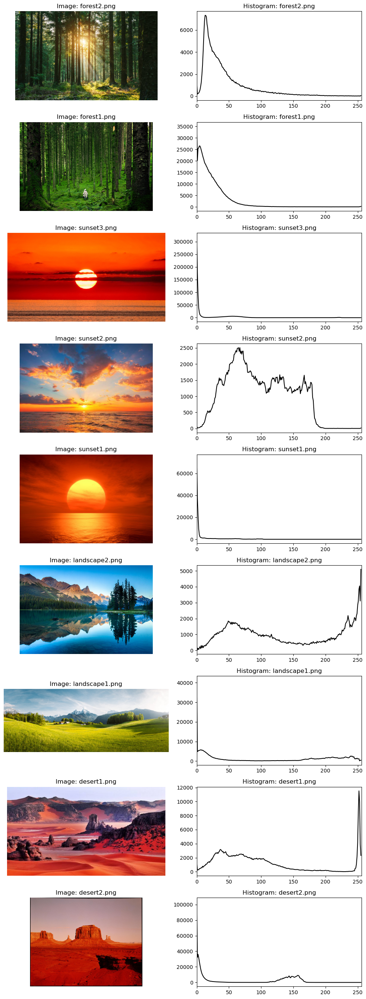

In [66]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

def calculate_entropy(channel):
    hist = cv.calcHist([channel], [0], None, [256], [0, 256])
    hist_norm = hist / hist.sum()
    entropy = -np.sum(hist_norm * np.log2(hist_norm + 1e-7))
    return entropy

def compare_histograms(img1, img2):
    hist1 = cv.calcHist([img1], [0], None, [256], [0, 256])
    hist2 = cv.calcHist([img2], [0], None, [256], [0, 256])
    return cv.compareHist(hist1, hist2, cv.HISTCMP_CORREL)

# Load images from 'images for manipulation 5' folder
image_folder = 'images for manipulation 5'
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]

if len(image_files) < 2:
    raise ValueError("Error: Need at least two images in 'images for manipulation 5' folder for comparison.")

# Read images into a list
grayscale_images = []
for file in image_files:
    img = cv.imread(os.path.join(image_folder, file))
    if img is not None:
        grayscale_images.append((file, img))

# Compute histogram similarities between all pairs
similarity_matrix = np.zeros((len(grayscale_images), len(grayscale_images)))
for i in range(len(grayscale_images)):
    for j in range(i, len(grayscale_images)):
        similarity_score = compare_histograms(grayscale_images[i][1], grayscale_images[j][1])
        similarity_matrix[i, j] = similarity_matrix[j, i] = similarity_score

# Display similarity results
print("\nHistogram Similarity Matrix:")
print("\t" + "\t".join([name for name, _ in grayscale_images]))
for i, (name, _) in enumerate(grayscale_images):
    print(name + "\t" + "\t".join([f"{similarity_matrix[i, j]:.4f}" for j in range(len(grayscale_images))]))

# Plot histograms of images
fig, axes = plt.subplots(len(grayscale_images), 2, figsize=(10, len(grayscale_images) * 3))

for i, (name, img) in enumerate(grayscale_images):
    hist = cv.calcHist([img], [0], None, [256], [0, 256])
    
    # Show the image
    axes[i, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    axes[i, 0].axis('off')
    axes[i, 0].set_title(f"Image: {name}")

    # Show the histogram
    axes[i, 1].plot(hist, color='black')
    axes[i, 1].set_xlim([0, 256])
    axes[i, 1].set_title(f"Histogram: {name}")

plt.tight_layout()
plt.show()


Histogram Similarity Matrix:
	forest2.png	forest1.png	sunset3.png	sunset2.png	sunset1.png	landscape2.png	landscape1.png	desert1.png	desert2.png
forest2.png	1.0000	0.7130	0.1730	-0.2180	0.4224	0.6627	-0.5260	0.1091	0.1410
forest1.png	0.7130	1.0000	0.1050	-0.2890	0.4257	0.6060	-0.7755	0.1322	0.2543
sunset3.png	0.1730	0.1050	1.0000	0.2231	0.3325	0.3764	0.0847	0.4642	0.3000
sunset2.png	-0.2180	-0.2890	0.2231	1.0000	0.4373	0.1918	0.6934	0.4014	0.1797
sunset1.png	0.4224	0.4257	0.3325	0.4373	1.0000	0.7684	0.0093	0.4829	0.5229
landscape2.png	0.6627	0.6060	0.3764	0.1918	0.7684	1.0000	-0.2070	0.3379	0.4337
landscape1.png	-0.5260	-0.7755	0.0847	0.6934	0.0093	-0.2070	1.0000	0.0685	0.0846
desert1.png	0.1091	0.1322	0.4642	0.4014	0.4829	0.3379	0.0685	1.0000	-0.0127
desert2.png	0.1410	0.2543	0.3000	0.1797	0.5229	0.4337	0.0846	-0.0127	1.0000


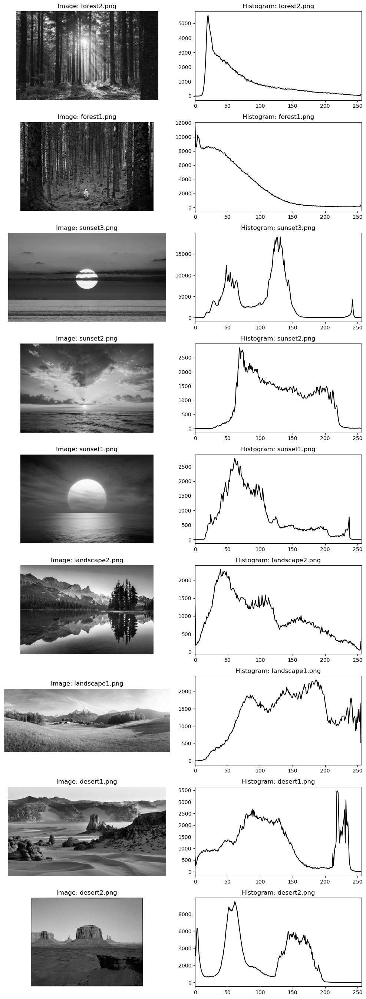

In [69]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

def calculate_entropy(channel):
    hist = cv.calcHist([channel], [0], None, [256], [0, 256])
    hist_norm = hist / hist.sum()
    entropy = -np.sum(hist_norm * np.log2(hist_norm + 1e-7))
    return entropy

def compare_histograms(img1, img2):
    hist1 = cv.calcHist([img1], [0], None, [256], [0, 256])
    hist2 = cv.calcHist([img2], [0], None, [256], [0, 256])
    return cv.compareHist(hist1, hist2, cv.HISTCMP_CORREL)

# Load images from 'images for manipulation 5' folder
image_folder = 'images for manipulation 5'
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]

if len(image_files) < 2:
    raise ValueError("Error: Need at least two images in 'images for manipulation 5' folder for comparison.")

# Read images into a list
grayscale_images = []
for file in image_files:
    img = cv.imread(os.path.join(image_folder, file), cv.IMREAD_GRAYSCALE)
    if img is not None:
        grayscale_images.append((file, img))

# Compute histogram similarities between all pairs
similarity_matrix = np.zeros((len(grayscale_images), len(grayscale_images)))
for i in range(len(grayscale_images)):
    for j in range(i, len(grayscale_images)):
        similarity_score = compare_histograms(grayscale_images[i][1], grayscale_images[j][1])
        similarity_matrix[i, j] = similarity_matrix[j, i] = similarity_score

# Display similarity results
print("\nHistogram Similarity Matrix:")
print("\t" + "\t".join([name for name, _ in grayscale_images]))
for i, (name, _) in enumerate(grayscale_images):
    print(name + "\t" + "\t".join([f"{similarity_matrix[i, j]:.4f}" for j in range(len(grayscale_images))]))

# Plot histograms of images
fig, axes = plt.subplots(len(grayscale_images), 2, figsize=(10, len(grayscale_images) * 3))

for i, (name, img) in enumerate(grayscale_images):
    hist = cv.calcHist([img], [0], None, [256], [0, 256])
    
    # Show the image
    axes[i, 0].imshow(img, cmap='gray')
    axes[i, 0].axis('off')
    axes[i, 0].set_title(f"Image: {name}")

    # Show the histogram
    axes[i, 1].plot(hist, color='black')
    axes[i, 1].set_xlim([0, 256])
    axes[i, 1].set_title(f"Histogram: {name}")

plt.tight_layout()
plt.show()

#### Conclusion:

- Forest images are strongly correlated (0.7130), showing similar intensity distributions.
- Sunset images share moderate similarity (0.3325 - 0.4373), but sunset3.png is slightly different.
- Desert images have weak correlation (-0.0127), indicating different lighting or contrast.
- Landscapes vs. Forests: Negative correlations (-0.7755) suggest distinct brightness and tonal distribution.
- Overall: Higher scores indicate similar tones, while lower/negative values suggest different lighting or exposure.